# TODO: add preface and finish conclusion. Covert charts using Plotly if possible!

# Introduction
This notebook is group 2's midterm exam. We made a Exploratory Data Analysis (EDA) about two different hotels. One Resort hotel and one City hotel.



This notebook was created using data from Kaggle (https://www.kaggle.com/jessemostipak/hotel-booking-demand) and other Kaggle existing notebooks

The data contains "bookings due to arrive between the 1st of July of 2015 and the 31st of August 2017".

From the publication (https://www.sciencedirect.com/science/article/pii/S2352340918315191) we know that both hotels are located in Portugal (southern Europe) ("H1 at the resort region of Algarve and H2 at the city of Lisbon"). The distance between these two locations is ca. 280 km by car and both locations border on the north atlantic.

# install dependencies

In [ ]:
!pip install plotly
!pip install folium
!pip install jupyterthemes

Set theme, jupyter notebook's theme looks ugly

In [ ]:
! jt -t solarizedd

# import libraries

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import plotly.express as px
import plotly.offline as pyo
import folium

from plotly.offline import init_notebook_mode, iplot
from pprint import pprint
import plotly.graph_objects as go
from plotly.subplots import make_subplots

Initialize Plotly to work offline

In [ ]:
pyo.init_notebook_mode()

Set styles

In [ ]:
sns.set(style="whitegrid")
pd.set_option("display.max_columns", 36)

Read data

In [ ]:
filepath = 'C:\\Users\\toduc\\Downloads\\hotel_data\\hotel_bookings.csv'
full_data = pd.read_csv(filepath)

Data shape

In [ ]:
full_data.shape

(119390, 32)

Meaning of each column

> 1. hotel: Resort Hotel or City Hotel
> 2. is_canceled: Value indicating if the booking was canceled (1) or not (0)
> 3. lead_time: Number of days between the booking date to the arrival date
> 4. arrival_date_year: Year of arrival
> 5. arrival_date_month: Month of arrival
> 6. arrival_date_week_number: Week number according to year of arrival
> 7. arrival_date_day_of_month: Day of arrival
> 8. stays_in_weekend_nights: Number of weekend nights booked (Saturday or Sunday)
> 9. stays_in_week_nights: Number of week nights booked (Monday to Friday)
> 10. adults: Number of adults
> 11. children: Number of children
> 12. babies: Number of babies
> 13. meal: Type of meal booked
> 14. country: Country of origin
> 15. market_segment: Market segment designation, typically influences the price sensitivity
> 16. distribution_channel: Booking distribution channel, refers to how the booking was made
> 17. is_repeated_guest: Value indication if the booking was from a repeated guest (1) or not (0)
> 18. previous_cancellations: Number of previous cancellations prior to current booking
> 19. previous_bookings_not_canceled: Number of previous booking not canceled prior to current booking
> 20. reserved_room_type: Code of room type reserved
> 21. assigned_room_type: Code for the type of room assigned to the booking
> 22. booking_changes: Number of changes made to the booking since entering the hotel management system
> 23. deposit_type: Type of deposit made for the reservation
> 24. agent: ID of the travel agency that made the booking
> 25. company: ID of the company/organization that made the booking or is responsible for payment
> 26. days_in_waiting_list: Number of days booking was in the waiting list until it was confirmed
> 27. customer_type: Type of booking
> 28. adr: Average Daily Rate (the sum of transactions divided by the number of nights stayed)
> 29. required_car_parking_spaces: Number of car parking spaces requested
> 30. total_of_special_requests: Number of special requests made by the customer
> 31. reservation_status: Last reservation status (Canceled, Check-Out, No-Show)
> 32. reservation_status_date: Date at which the last status was set
>
>> ##### *Understanding the features could help gain insight on how to treat null values.*

Unique values of columns

In [ ]:
unique = full_data.apply(lambda col: col.unique())
unique

hotel                                                    [Resort Hotel, City Hotel]
is_canceled                                                                  [0, 1]
lead_time                         [342, 737, 7, 13, 14, 0, 9, 85, 75, 23, 35, 68...
arrival_date_year                                                [2015, 2016, 2017]
arrival_date_month                [July, August, September, October, November, D...
arrival_date_week_number          [27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 3...
arrival_date_day_of_month         [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14...
stays_in_weekend_nights           [0, 1, 2, 4, 3, 6, 13, 8, 5, 7, 12, 9, 16, 18,...
stays_in_week_nights              [0, 1, 2, 3, 4, 5, 10, 11, 8, 6, 7, 15, 9, 12,...
adults                            [2, 1, 3, 4, 40, 26, 50, 27, 55, 0, 20, 6, 5, 10]
children                                            [0.0, 1.0, 2.0, 10.0, 3.0, nan]
babies                                                             [0, 1, 2,

Check for missing values

In [ ]:
full_data.isnull().sum()

hotel                                  0
is_canceled                            0
lead_time                              0
arrival_date_year                      0
arrival_date_month                     0
arrival_date_week_number               0
arrival_date_day_of_month              0
stays_in_weekend_nights                0
stays_in_week_nights                   0
adults                                 0
children                               4
babies                                 0
meal                                   0
country                              488
market_segment                         0
distribution_channel                   0
is_repeated_guest                      0
previous_cancellations                 0
previous_bookings_not_canceled         0
reserved_room_type                     0
assigned_room_type                     0
booking_changes                        0
deposit_type                           0
agent                              16340
company         

Process missing data

Replace missing values:
> "agent": If no agency is given, booking was most likely made without one.
> "company": If none given, it was most likely private.
> "meal" contains values "Undefined", which is equal to SC.

> The rest schould be self-explanatory.

> Some rows contain entreis with 0 adults, 0 children and 0 babies. Dropping these entries with no guests.


In [ ]:
nan_replacements = {"children:": 0.0,"country": "Unknown", "agent": 0, "company": 0}
full_data_cln = full_data.fillna(nan_replacements)


full_data_cln["meal"].replace("Undefined", "SC", inplace=True)


zero_guests = list(full_data_cln.loc[full_data_cln["adults"]
                   + full_data_cln["children"]
                   + full_data_cln["babies"]==0].index)
full_data_cln.drop(full_data_cln.index[zero_guests], inplace=True)
full_data_cln.head()

,hotel,is_canceled,lead_time,arrival_date_year,arrival_date_month,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,children,babies,meal,country,market_segment,distribution_channel,is_repeated_guest,previous_cancellations,previous_bookings_not_canceled,reserved_room_type,assigned_room_type,booking_changes,deposit_type,agent,company,days_in_waiting_list,customer_type,adr,required_car_parking_spaces,total_of_special_requests,reservation_status,reservation_status_date
0,Resort Hotel,0,342,2015,July,27,1,0,0,2,0.0,0,BB,PRT,Direct,Direct,0,0,0,C,C,3,No Deposit,0.0,0.0,0,Transient,0.0,0,0,Check-Out,2015-07-01
1,Resort Hotel,0,737,2015,July,27,1,0,0,2,0.0,0,BB,PRT,Direct,Direct,0,0,0,C,C,4,No Deposit,0.0,0.0,0,Transient,0.0,0,0,Check-Out,2015-07-01
2,Resort Hotel,0,7,2015,July,27,1,0,1,1,0.0,0,BB,GBR,Direct,Direct,0,0,0,A,C,0,No Deposit,0.0,0.0,0,Transient,75.0,0,0,Check-Out,2015-07-02
3,Resort Hotel,0,13,2015,July,27,1,0,1,1,0.0,0,BB,GBR,Corporate,Corporate,0,0,0,A,A,0,No Deposit,304.0,0.0,0,Transient,75.0,0,0,Check-Out,2015-07-02
4,Resort Hotel,0,14,2015,July,27,1,0,2,2,0.0,0,BB,GBR,Online TA,TA/TO,0,0,0,A,A,0,No Deposit,240.0,0.0,0,Transient,98.0,0,1,Check-Out,2015-07-03


Data information after cleaning up

In [ ]:
full_data_cln.shape

(119210, 32)

After cleaning, separate Resort and City hotel
To know the acutal visitor numbers, only bookings that were not canceled are included.

In [ ]:
resort = full_data_cln.loc[(full_data_cln["hotel"] == "Resort Hotel") & (full_data_cln["is_canceled"] == 0)]
city = full_data_cln.loc[(full_data_cln["hotel"] == "City Hotel") & (full_data_cln["is_canceled"] == 0)]

# 1.EDA

## Describe general information

### Waitday group by each hotel

In [ ]:
leadtime = full_data_cln.pivot_table(columns=['lead_time'], aggfunc='size')
# fig = px.bar(leadtime, title= 'Total wait days')

fig = go.Figure(data=[
    go.Bar(y = leadtime)],
    layout_xaxis_range=[0,700], layout_yaxis_range=[0,6500])

fig.update_layout(
    title="Waitdays distribution",
    xaxis_title="Number of waitdays",
    yaxis_title="Number of customers",
    legend_title="Title:",
    font=dict(
        family="Helvetica",
        size=12,
        color="Black"
    )
)
fig.show()

citywait= city.pivot_table(columns=['lead_time'], aggfunc='size')
resortwait = resort.pivot_table(columns=['lead_time'], aggfunc='size')

fig = go.Figure(data=[
    go.Bar(name='Resorts', y=resortwait),
    go.Bar(name='City', y=citywait)],
    layout_xaxis_range=[0,700], layout_yaxis_range=[0,6500])
# Change the bar mode
fig.update_layout(
    barmode='stack',
    title="Waitdays distribution group by hotel",
    xaxis_title="Number of waitdays",
    yaxis_title="Number of customers",
    legend_title="Title:",
    legend=dict(
        orientation="h",
        yanchor="bottom",
        y=1.02,
        xanchor="right",
        x=1),
    font=dict(
        family="Helvetica",
        size=12,
        color="Black"
    )
)
fig.show()

Look at the chart, there is no surprise when the number of customers decreases when the figure of the waiting day increases. We can also see that the number of customers who booked "Resort hotel" are willing to wait for a longer period compare with customers of "City hotel.

### Adults, Children and Babies distribution group by hotel

In [ ]:
city_adult= city.pivot_table(columns=['adults'], aggfunc='size')
resort_adult = resort.pivot_table(columns=['adults'], aggfunc='size')

fig = go.Figure(data=[
    go.Bar(name='Resorts', y=resort_adult),
    go.Bar(name='City', y=city_adult),
])

fig.update_layout(
    barmode='stack',
    title="Adults distribution group by hotel",
    xaxis_title="Number of adults",
    yaxis_title="Value",
    legend_title="Title:",
    legend=dict(
        orientation="h",
        yanchor="bottom",
        y=1.02,
        xanchor="right",
        x=1),
    font=dict(
        family="Helvetica",
        size=12,
        color="Black"
    )
)

fig.show()

city_babies= city.pivot_table(columns=['babies'], aggfunc='size')
resort_babies = resort.pivot_table(columns=['babies'], aggfunc='size')

fig = go.Figure(data=[
    go.Bar(name='Resorts', y=resort_babies),
    go.Bar(name='City', y=city_babies),
],)


fig.update_layout(
    barmode='stack',
    title="Babies distribution group by hotel",
    xaxis_title="Number of babies",
    yaxis_title="Value",
    legend_title="Title: ",
    legend=dict(
        orientation="h",
        yanchor="bottom",
        y=1.02,
        xanchor="right",
        x=1),
    font=dict(
        family="Helvetica",
        size=12,
        color="Black"
    )
)
fig.show()


city_children= city.pivot_table(columns=['children'], aggfunc='size')
resort_children = resort.pivot_table(columns=['children'], aggfunc='size')

fig = go.Figure(data=[
    go.Bar(name='Resorts', y=resort_children),
    go.Bar(name='City', y=city_children),
])
fig.update_layout(
    barmode='stack',
    title="Children distribution group by hotel",
    xaxis_title="Number of Children",
    yaxis_title="Value",
    legend_title="Title:",
    legend=dict(
        orientation="h",
        yanchor="bottom",
        y=1.02,
        xanchor="right",
        x=1),
    font=dict(
        family="Helvetica",
        size=12,
        color="Black"
    )
)
fig.show()

The charts show us a very interesting pattern, most adults will not travel with babies or children. As we can see in the chart the total number of adults who get to 2 hotels is around 70k customers, while the figure for both children is only 6.2k. Around 50% of adults travelled with another adults, which indicate that they might have married. Generally, there are only around 1-2 children (or babies) travel with adults. From the chart "Number of adults", we can see that there is a column with 0 adults, this might me the booking from young adults who havent pass the age of 18, the one who travel alone, or with husband, wife, friends (The legal age for getting married in Portugal is 16).

### Cancelled distribution group by hotel

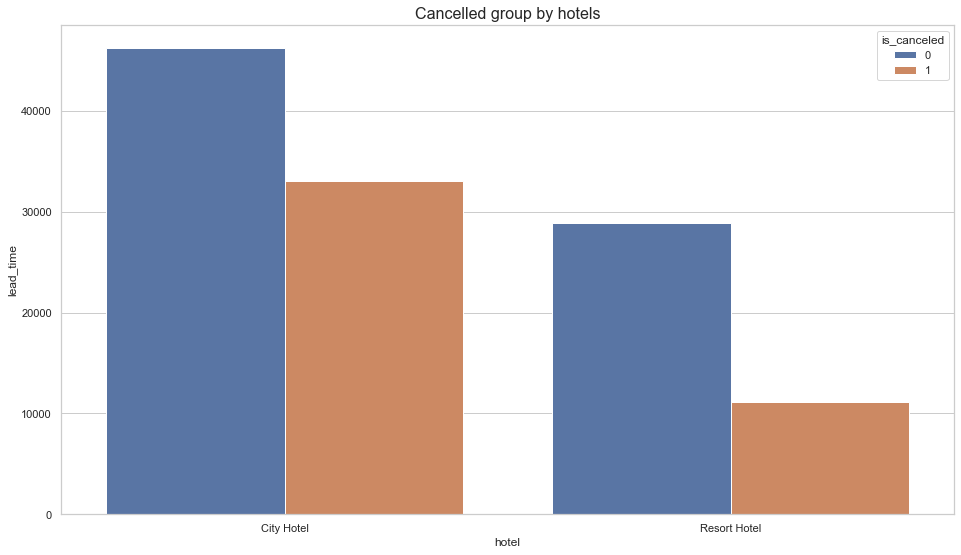

In [ ]:
city_canceled= city.pivot_table(columns=['is_canceled'], aggfunc='size')
resort_canceled = resort.pivot_table(columns=['is_canceled'], aggfunc='size')

fig = go.Figure(data=[
    go.Bar(name='Resorts', y=resort_canceled),
    go.Bar(name='City', y=city_canceled),
])
# Change the bar mode
fig.update_layout(
    barmode='group',
    title="Canceled group by hotel",
    xaxis_title="Number of cancelation",
    yaxis_title="Value",
    legend_title="Legend Title",
        legend=dict(
        orientation="h",
        yanchor="bottom",
        y=1.02,
        xanchor="right",
        x=1),
    font=dict(
        family="Helvetica",
        size=12,
        color="Black"
    )
)
fig.show()

plt.figure(figsize=(16, 9))
plt.title("Cancelled group by hotels", fontsize=16)
ax=sns.barplot(x='hotel',y='lead_time',hue='is_canceled', data=full_data.groupby(["hotel","is_canceled"]).lead_time.count().reset_index())

# ax.legend(legend_data)
plt.show()



First, we can see that the cancelation rate have a tendency to occur more frequently in City Hotel, as prescribe in the chart, blue mean not canceled (encoded as 0), while 1 is canceled (encode with 1).

The customers who booked many days in advanced tend to canceled more, this means short amount of waitdays leave customer less time to change their mind.

### Cancelations by room type

In [ ]:

fig = px.histogram(x=full_data["reserved_room_type"], color=full_data["is_canceled"])
fig.update_layout(
    barmode='group',
    title="Cancellations According to Room Type",
    xaxis_title="Reserved room type",
    yaxis_title="Number of cancel",
    legend_title="Cancel (1) or not (0)",
    legend=dict(
        orientation="h",
        yanchor="bottom",
        y=1.02,
        xanchor="right",
        x=1),
    font=dict(
        family="Helvetica",
        size=16,
        color="Black"
    ),
    width=800,
    height=600
)
fig.show()

We can see that there is a huge amount of customers who canceled room type A in both hotels, in fact, the total number of cancellations in group A is almost 33.63k, 3 times high than the total cancellation of all other rooms, which is 10.545k. The second most canceled room is room D with a total of 6.102k canceled times. Other room's cancellations are always lower than 2k, the figure of room E. All of the others archived impressive cancellation times, especially room L and P with only 6 and 12 canceled times respectively.

### Percentage bookings were canceled, group by month?

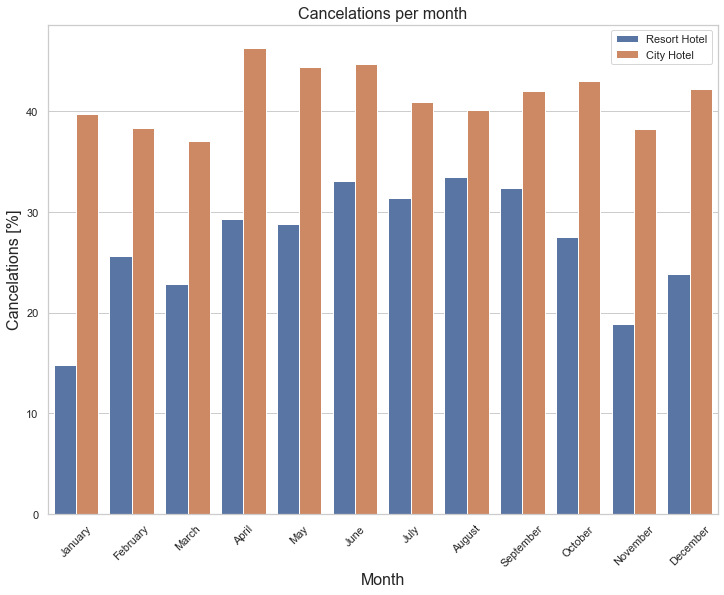

Interactive chart down below (Not in order)


In [ ]:
# Create a DateFrame with the relevant data:
res_book_per_month = full_data_cln.loc[(full_data_cln["hotel"] == "Resort Hotel")].groupby("arrival_date_month")["hotel"].count()
res_cancel_per_month = full_data_cln.loc[(full_data_cln["hotel"] == "Resort Hotel")].groupby("arrival_date_month")["is_canceled"].sum()

cty_book_per_month = full_data_cln.loc[(full_data_cln["hotel"] == "City Hotel")].groupby("arrival_date_month")["hotel"].count()
cty_cancel_per_month = full_data_cln.loc[(full_data_cln["hotel"] == "City Hotel")].groupby("arrival_date_month")["is_canceled"].sum()

res_cancel_data = pd.DataFrame({"Hotel": "Resort Hotel",
                                "Month": list(res_book_per_month.index),
                                "Bookings": list(res_book_per_month.values),
                                "Cancelations": list(res_cancel_per_month.values)})
cty_cancel_data = pd.DataFrame({"Hotel": "City Hotel",
                                "Month": list(cty_book_per_month.index),
                                "Bookings": list(cty_book_per_month.values),
                                "Cancelations": list(cty_cancel_per_month.values)})

full_cancel_data = pd.concat([res_cancel_data, cty_cancel_data], ignore_index=True)
full_cancel_data["cancel_percent"] = full_cancel_data["Cancelations"] / full_cancel_data["Bookings"] * 100

# order by month:
ordered_months = ["January", "February", "March", "April", "May", "June",
                  "July", "August", "September", "October", "November", "December"]

full_cancel_data["Month"] = pd.Categorical(full_cancel_data["Month"], categories=ordered_months, ordered=True)

# show figure:
plt.figure(figsize=(12, 9))
sns.barplot(x = "Month", y = "cancel_percent" , hue="Hotel",
            hue_order = ["Resort Hotel","City Hotel"], data=full_cancel_data)
plt.title("Cancelations per month", fontsize=16)
plt.xlabel("Month", fontsize=16)
plt.xticks(rotation=45)
plt.ylabel("Cancelations [%]", fontsize=16)
plt.legend(loc="upper right")
plt.show()

print('Interactive chart down below (Not in order)')

ordered_months = ["April", "August","December", "February", "January", "July", "June", "March", "May", "November", "October", "September",  ]
fig = go.Figure(data = [
    go.Bar(name='Resorts', y=full_cancel_data[full_cancel_data['Hotel'] == 'Resort Hotel']['cancel_percent'], x=ordered_months),
    go.Bar(name='City', y=full_cancel_data[full_cancel_data['Hotel'] == 'City Hotel']['cancel_percent'], x=ordered_months),
])
fig.update_layout(
    barmode='group',
    title="Cancelations per month",
    xaxis_title="Month",
    yaxis_title="Cancel rate",
    legend=dict(
        orientation="h",
        yanchor="bottom",
        y=1.02,
        xanchor="right",
        x=1),
    font=dict(
        family="Helvetica",
        size=16,
        color="Black"
    )
)
fig.show()

For the City hotel the relative number of cancelations is higher than that of Resort hotel throughout the year, and not fluctuate alot with the lowest cancellation rate is 37% and highest at 46%
For the Resort hotel the figure increased from the beginning of the year and reached its peak in the summer (June, July and August) before slowly drop down for the rest of the year. The lowest rate is in January at only 14.8% and the highest months is the middle of summer in June, July and August.

In [ ]:
# absolute cancelations:
total_cancelations = full_data_cln["is_canceled"].sum()
resort_cancelations = full_data_cln.loc[full_data_cln["hotel"] == "Resort Hotel"]["is_canceled"].sum()
city_cancelations = full_data_cln.loc[full_data_cln["hotel"] == "City Hotel"]["is_canceled"].sum()

# as percent:
rel_cancel = total_cancelations / full_data_cln.shape[0] * 100
resort_rel_cancel = resort_cancelations / full_data_cln.loc[full_data_cln["hotel"] == "Resort Hotel"].shape[0] * 100
city_rel_cancel = city_cancelations / full_data_cln.loc[full_data_cln["hotel"] == "City Hotel"].shape[0] * 100

print(f"Total bookings canceled: {total_cancelations:,} ({rel_cancel:.0f} %)")
print(f"Resort hotel bookings canceled: {resort_cancelations:,} ({resort_rel_cancel:.0f} %)")
print(f"City hotel bookings canceled: {city_cancelations:,} ({city_rel_cancel:.0f} %)")

Total bookings canceled: 44,199 (37 %)
Resort hotel bookings canceled: 11,120 (28 %)
City hotel bookings canceled: 33,079 (42 %)


### Booking distribution

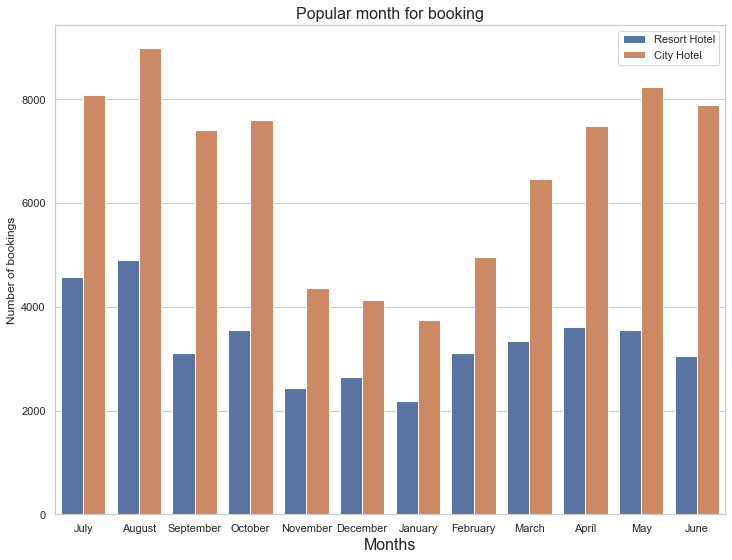

In [ ]:
plt.figure(figsize=(12,9))
legend_data={'Resort Hotel':0 ,'City Hotel':1}
plt.title("Popular month for booking", fontsize=16)
plt.xlabel("Month", fontsize=16)
ax=sns.countplot(x='arrival_date_month',data=full_data, hue='hotel')
ax.set(xlabel='Months',ylabel='Number of bookings')
ax.legend(legend_data)
plt.show()


The chart here shows fancinating data. In the preious chart, we see that the cancelation rate of City hotel is higher than that of Resort Hotel. And in this chart, we can see the that throughout the year, the booking number of both hotels are low in the winter, high in the summer, which indicate that people tend to stay home in the winter, and in the summer, they want to go out. 

The figure of City Hotel are always higher than that of Resort Hotel, the gap are wider in the winter, and narrower in the summer

### Cancellation by repeated guests

In [ ]:
fig = px.histogram(full_data_cln, x="is_canceled", color="is_repeated_guest")
fig.update_layout(
    barmode='group',
    title="Cancelations by repeated guess",
    xaxis_title="Repeated guess",
    yaxis_title="Cancellations",
    legend=dict(
        orientation="h",
        yanchor="bottom",
        y=1.02,
        xanchor="right",
        x=1),
    font=dict(
        family="Helvetica",
        size=12,
        color="Black"
    )
)
fig.show()

Note: left is City Hotel, right is Resort Hotel

We can see there is no surprise that repeated guests do not cancel their reservations, most of cancellations are from new customers. Of course there are some exceptions. Also most of the customers are new guess.

### Ordered meal

In [ ]:
city_meal = full_data[full_data['hotel'] == 'City Hotel']
citywait= city.pivot_table(columns=['meal'], aggfunc='size')
resort_meal = full_data[full_data['hotel'] == 'Resort Hotel']
resortwait = resort.pivot_table(columns=['meal'], aggfunc='size')

fig = go.Figure(data=[
    go.Bar(name='Resorts', y=resortwait, x = ['BB: Bed & Breakfast', 'FB: Full Board (Beakfast, Lunch and Dinner)', 'HB: Half Board', 'SC:idk', 'Undefined']),
    go.Bar(name='City', y=citywait, x = ['BB: Bed & Breakfast', 'FB: Full Board (Beakfast, Lunch and Dinner)', 'HB: Half Board', 'SC:idk', 'Undefined']),
])

fig.update_layout(
    barmode='group',
    title="Meal Ordered",
    xaxis_title="Type of ordered meal",
    yaxis_title="Number of meal ordered",
    legend_title="Legend Title",
    font=dict(
        family="Helvetica",
        size=12,
        color="Black"
    ),
    width=800,
    height=900
)
fig.show()

Conclusion

BB means Break and Breakfast, took 77,31% of customers

HB means Half Board, took 12,11% of customers

FB means Full Board (includes Beakfast, Lunch and Dinner), took 0,66% of customers

SC: idk what this means(maybe not defined) in Kaggle they put it as no meals as all, took 9,89% of customers

From the chart, we can see that customers prefered book rooms that breakfast are included, the trend applies for both of the hotel. This service is normal since this services are free and normally included in the price, in case customers dont have time to find else where to have breakfast. Some of them like an additional meal, in this case is dinner. Businessmen come to hotel will not need to find another place to eat, they could eat within the hotels.



### Reserved and assigned room type

In [ ]:
city_reserved= city.pivot_table(columns=['reserved_room_type'], aggfunc='size')
resort_reserved = resort.pivot_table(columns=['reserved_room_type'], aggfunc='size')

fig = go.Figure(data=[
    go.Bar(name='Resorts', y=resort_reserved, x = ['A', 'B', 'C', 'D', 'E', 'F', 'G', 'H', 'L']),
    go.Bar(name='City', y=city_reserved,   x = ['A', 'B', 'C', 'D', 'E', 'F', 'G']),
])

fig.update_layout(
    barmode='group',
    title="Reserved room type",
    xaxis_title="Type of reserved room",
    yaxis_title="Number of reservation",
    legend_title="Legend Title",
    font=dict(
        family="Helvetica",
        size=16,
        color="Black"
    ),
    width = 900,
    height = 800
)
fig.show()

city_assigned= city.pivot_table(columns=['assigned_room_type'], aggfunc='size')
resort_assigned = resort.pivot_table(columns=['assigned_room_type'], aggfunc='size')
# TODO: fix this mess
fig = go.Figure(data=[
    go.Bar(name='Resorts', y=resort_assigned , x = ['A', 'B', 'C', 'D', 'E', 'F', 'G', 'H', 'I']),
    go.Bar(name='City', y=city_assigned, x = ['A', 'B', 'C', 'D', 'E', 'F', 'G', 'K']),
])

# Change the bar mode
fig.update_layout(
    barmode='group',
    title="Assigned room type",
    xaxis_title="Type of assigned room",
    yaxis_title="Number of assigned room",
    legend_title="Legend Title",
    font=dict(
        family="Helvetica",
        size=16,
        color="Black"
    ),
    width = 900,
    height = 800
)
fig.show()

As we can see the number of reserved and assigned room share the same pattern, but not the same, which indicates that hotels have changed the customer's reservation room types. Also, as the charts show, customers are into room type A and D since the number of reservation of both hotels are more than 5k of room type D, and with type A the figure is more than 17k. Other rooms in both reserved and assigned are below 5k. 

### Boxplot Distribution of Nights Spent at Hotels by Market Segment and Hotel Type

[Text(0.5, 0, 'Market segment'),
 Text(0, 0.5, 'Stays in weekend nights'),
 Text(0.5, 1.0, 'Weekend nights spend at hotelgroup by booking channel')]

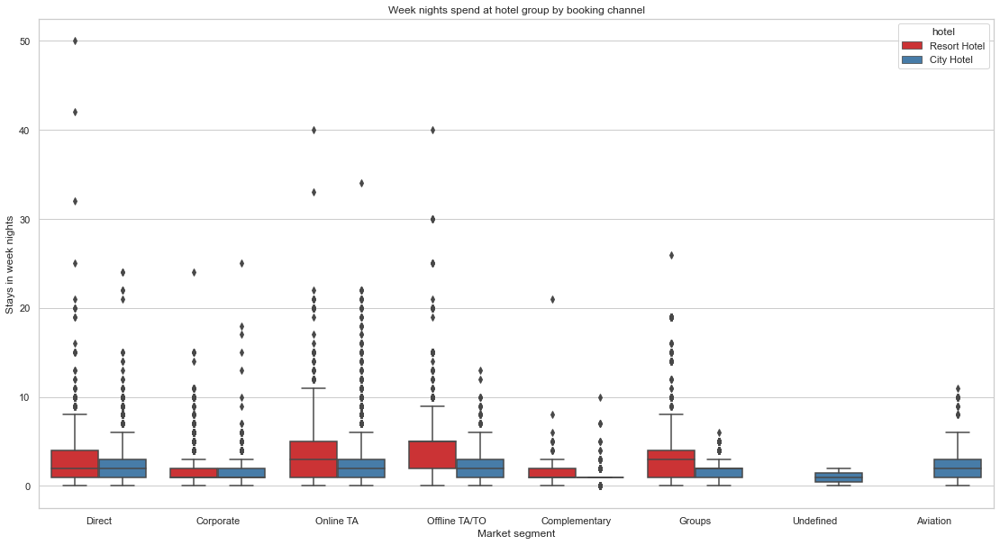

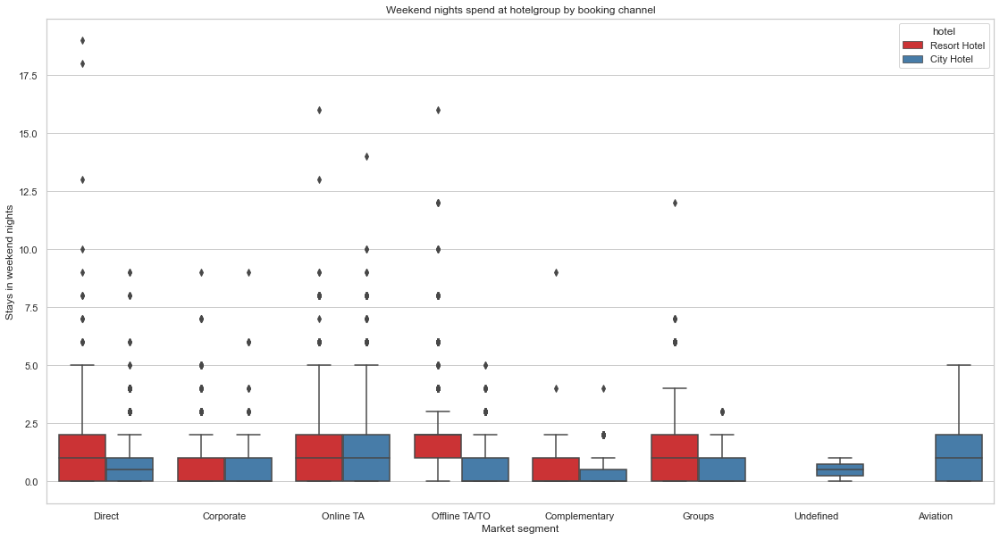

In [ ]:
plt.figure(figsize = (19,10))
fig = sns.boxplot(x = "market_segment", y = "stays_in_week_nights", data = full_data_cln, hue = "hotel", palette = 'Set1')
fig.set(xlabel ="Market segment", ylabel = "Stays in week nights", title ='Week nights spend at hotel group by booking channel')

plt.figure(figsize=(19,10))
fig = sns.boxplot(x = "market_segment", y = "stays_in_weekend_nights", data = full_data_cln, hue = "hotel", palette = 'Set1')
fig.set(xlabel ="Market segment", ylabel = "Stays in weekend nights", title ='Weekend nights spend at hotelgroup by booking channel')




It can be seen that most of the groups are normal distributed, some of them have high skewness. Looking at the distribution, most people do not seem to prefer to stay at the hotel for more than 1 week. But it seems normal to stay in resort hotels for up to 12-13 days. Although this changes according to the segments, staying longer than 15 days certainly creates outliers for each segment. If the total time feature was created by summing up the weekend and week nights, this would be clearer, but it can be clearly seen when looking at the two visualizations together.

As it turns out, customers from Aviation Segment do not seem to be staying at the resort hotels and have a relatively lower day average. Apart from that, the weekends and weekdays averages are roughly equal. Customers in the Aviation Segment are likely to arrive shortly due to business. Also probably most airports are a bit away from sea and its most likely to be closer to city hotels.

It is obvious that when people go to resort hotels, they prefer to stay more.

### Where do the guests come from?

#### Overall

In [ ]:
# get number of acutal guests by country
country_data = pd.DataFrame(full_data_cln.loc[full_data_cln["is_canceled"] == 0]["country"].value_counts())
#country_data.index.name = "country"
country_data.rename(columns={"country": "Number of Guests"}, inplace=True)
total_guests = country_data["Number of Guests"].sum()
country_data["Guests in %"] = round(country_data["Number of Guests"] / total_guests * 100, 2)
country_data["country"] = country_data.index
#country_data.loc[country_data["Guests in %"] < 2, "country"] = "Other"

# pie plot
fig = px.pie(country_data,
             values="Number of Guests",
             names="country",
             title="Home country of guests")
fig.update_traces(textposition="inside", textinfo="value+percent+label")
fig.show()
# fig.write_html('C:\\Users\\toduc\\OneDrive - National Economics University\\Desktop\\EAP_midterm\\pie_home_countries.html')

#### Group by hotel

In [ ]:
# booking for each hotel
city_completed = full_data_cln.loc[(full_data['hotel']=='City Hotel') & (full_data['is_canceled']==0)]
resort_completed = full_data_cln.loc[(full_data['hotel']=='Resort Hotel') & (full_data['is_canceled']==0)]

resort_countries = resort_completed['country'].value_counts().rename_axis('country').reset_index(name='count')

#Countries with less than a 100 completed booking are grouped into the category 'Other'
resort_countries.loc[resort_countries['count'] < 100, 'country'] = 'Other'

resort_values = resort_countries['count'].tolist()
resort_labels = resort_countries['country'].tolist()

city_countries = city_completed['country'].value_counts().rename_axis('country').reset_index(name='count')
city_countries.loc[city_countries['count'] < 100, 'country'] = 'Other'

city_values = city_countries['count'].tolist()
city_labels = city_countries['country'].tolist()

specs = [[{'type':'domain'}, {'type':'domain'}]]

fig = make_subplots(1,2, specs=specs, subplot_titles=['Resort Hotel','City Hotel'])

fig.add_trace(go.Pie(name='Resort Hotel', labels=resort_labels, values=resort_values),1,1)
fig.add_trace(go.Pie(name='City Hotel', labels=city_labels, values=city_values),1,2)

fig.update_traces(textposition='inside', 
                  textinfo='label+percent+value', 
                  hovertemplate='Country: %{label} <br>Completed Bookings: %{value} <br>Percent: %{percent}')

fig.update_layout(title='Hotel Guests by Country of Origin')

#### Show on map

In [ ]:
# show on map
guest_map = px.choropleth(country_data,
                    locations=country_data.index,
                    color=country_data["Guests in %"],
                    hover_name=country_data.index,
                    color_continuous_scale=px.colors.sequential.Sunsetdark,
                    title="Home country of guests")
guest_map.show()

Compare two hotels, we can see that Resort Hotel had higher local customers than City Hotel. At Resort Hotel, one third of the customer are from (PRT) Portugal compare with only one fifth of City Hotel. We can also see that most of the customers are foreiners. Look at the distribution, we can see that, customers from Germany and France like City Hotel more than Resort Hotel. As oppose to that, guesses from United Kingdom and Ireland prefer Resort Hotel.

### Devide customers into segments, group by hotel

In [ ]:
city_cus_type= city.pivot_table(columns=['customer_type'], aggfunc='size')
resort_cus_type = resort.pivot_table(columns=['customer_type'], aggfunc='size')

fig = go.Figure(data=[
    go.Bar(name='Resorts', y=resort_cus_type, x=['Contract', 'Group', 'Transient', 'Transient-Party']),
    go.Bar(name='City', y=city_cus_type,x=['Contract', 'Group', 'Transient', 'Transient-Party']),
])

fig.update_layout(
    barmode='group',
    title="Customer type",
    xaxis_title="Type of customer",
    yaxis_title="Number of customers",
    legend_title="Type of hotel",
    font=dict(
        family="Helvetica",
        size=16,
        color="Black"
    ),
    width = 900,
    height = 800
)

fig.show()

print('Type of customer   Percentage')
print('-----------------------------')
print(full_data['customer_type'].value_counts()/len(full_data['customer_type'])*100)

Type of customer   Percentage
-----------------------------
Transient          75.059050
Transient-Party    21.043638
Contract            3.414021
Group               0.483290
Name: customer_type, dtype: float64


Contract: There will be a contract given to customers when they booked the room.

Group: Counted when a group of customers booked.

Transient: A booking that are not belong to a group or a contract and not relevant to other type of booking.

Transient-party: Booking that are transient but only temporary and link with at least one other booking as well.

From the chart we can see that:

Transient 75,05%

Transient-party 21,04%

Contract: 3,41%

Group: 0,48%

The majority of customers are Transient, meaning the majority of customers are late booked customers. Contract and Group took a small proportion of the booked customers, which means they are early booked customer.

### How much do guests pay for a room per night?
Both hotels have different room types and different meal arrangements. Seasonal factors are also important. So the prices vary a lot.
Since no currency information is given, but Portugal is part of the European Monetary Union, I assume that all prices are in EUR.

In [ ]:
# Counting adults and children as paying guests only, not babies.
resort["adr_pp"] = resort["adr"] / (resort["adults"] + resort["children"])
city["adr_pp"] = city["adr"] / (city["adults"] + city["children"])

<ipython-input-28-109a0eba88bf>:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-28-109a0eba88bf>:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [ ]:
print("""From all non-canceled bookings, across all room types and meals, the average prices are:
Resort hotel: {:.2f} € per night and person.
City hotel: {:.2f} € per night and person."""
      .format(resort["adr_pp"].mean(), city["adr_pp"].mean()))

From all non-canceled bookings, across all room types and meals, the average prices are:
Resort hotel: 47.49 € per night and person.
City hotel: 59.27 € per night and person.


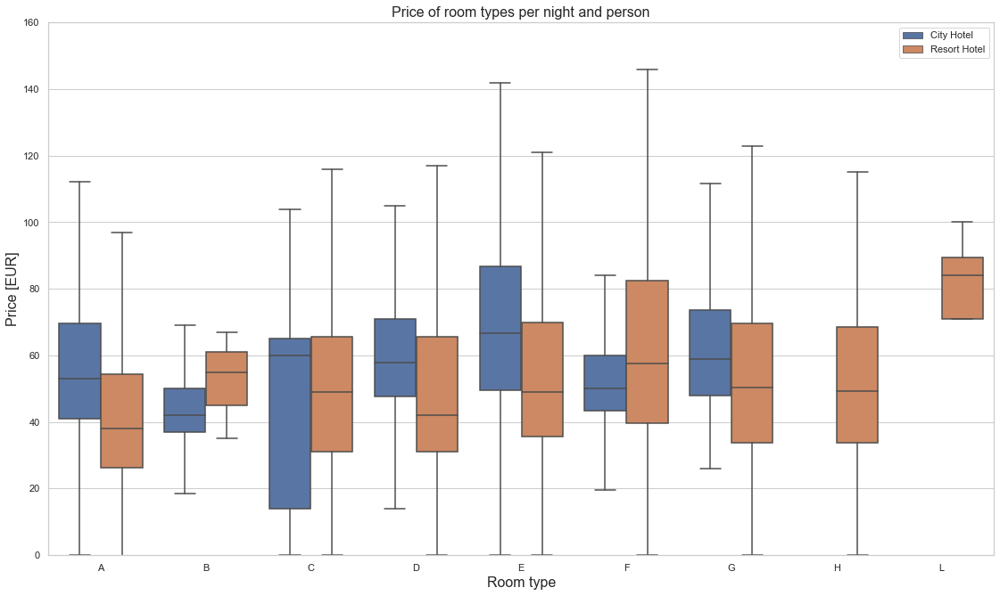

In [ ]:
# normalize price per night (adr):
full_data_cln["adr_pp"] = full_data_cln["adr"] / (full_data_cln["adults"] + full_data_cln["children"])
full_data_guests = full_data_cln.loc[full_data_cln["is_canceled"] == 0] # only actual guests
room_prices = full_data_guests[["hotel", "reserved_room_type", "adr_pp"]].sort_values("reserved_room_type")

# boxplot:
plt.figure(figsize=(19, 11))
sns.boxplot(x="reserved_room_type",
            y="adr_pp",
            hue="hotel",
            data=room_prices,
            hue_order=["City Hotel", "Resort Hotel"],
            fliersize=0)
plt.title("Price of room types per night and person", fontsize=16)
plt.xlabel("Room type", fontsize=16)
plt.ylabel("Price [EUR]", fontsize=16)
plt.legend(loc="upper right")
plt.ylim(0, 160)
plt.show()

This figure shows the average price per room, depending on its type and the standard deviation.
Note that due to data anonymization rooms with the same type letter may not necessarily be the same across hotels.

### How does the price per night vary over the year?
To keep it simple, I'm using the average price per night and person, regardless of the room type and meal.

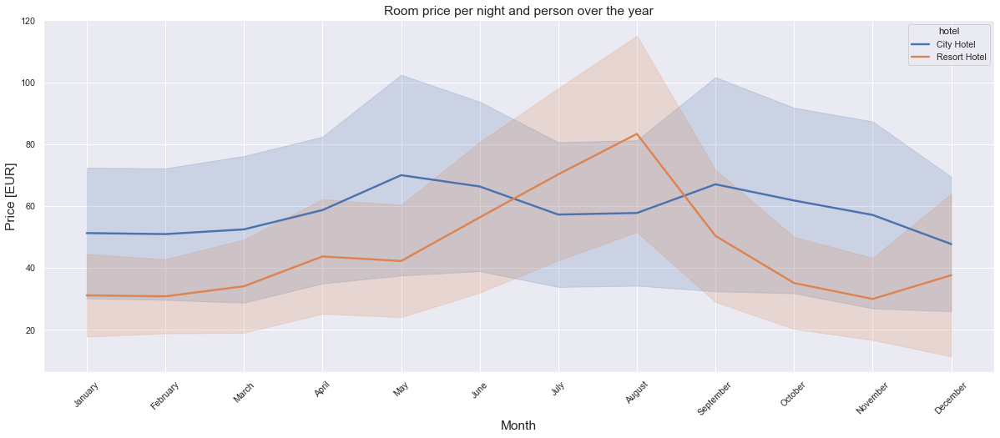

Percentage of people coming each month:
 August       11.623252
July         10.604741
May           9.876037
October       9.347517
April         9.288048
June          9.162409
September     8.801407
March         8.203367
February      6.757685
November      5.690594
December      5.678868
January       4.966078
Name: arrival_date_month, dtype: float64


In [ ]:
# grab data:
room_prices_mothly = full_data_guests[["hotel", "arrival_date_month", "adr_pp"]].sort_values("arrival_date_month")

# order by month:
ordered_months = ["January", "February", "March", "April", "May", "June",
          "July", "August", "September", "October", "November", "December"]
room_prices_mothly["arrival_date_month"] = pd.Categorical(room_prices_mothly["arrival_date_month"], categories=ordered_months, ordered=True)

# barplot with standard deviation:
plt.figure(figsize=(21, 8))
sns.lineplot(x = "arrival_date_month", y="adr_pp", hue="hotel", data=room_prices_mothly,
            hue_order = ["City Hotel", "Resort Hotel"], ci="sd", size="hotel", sizes=(2.5, 2.5))
plt.title("Room price per night and person over the year", fontsize=16)
plt.xlabel("Month", fontsize=16)
plt.xticks(rotation=45)
plt.ylabel("Price [EUR]", fontsize=16)
plt.show()

print('Percentage of people coming each month:\n', full_data['arrival_date_month'].value_counts()/len(full_data['arrival_date_month'])*100)

This clearly shows that the prices in the Resort hotel are much higher during the summer (no surprise here).
The price of the city hotel varies less and is most expensive during spring and autumn.

City Hotel had more guesses in Sping and Autumn, and due to Demand and Supply rule, the price in these periods are also the highest. There is a dip in July and August, and the price in this range are lower than that of Resort Hotel

### Which are the most busy month?

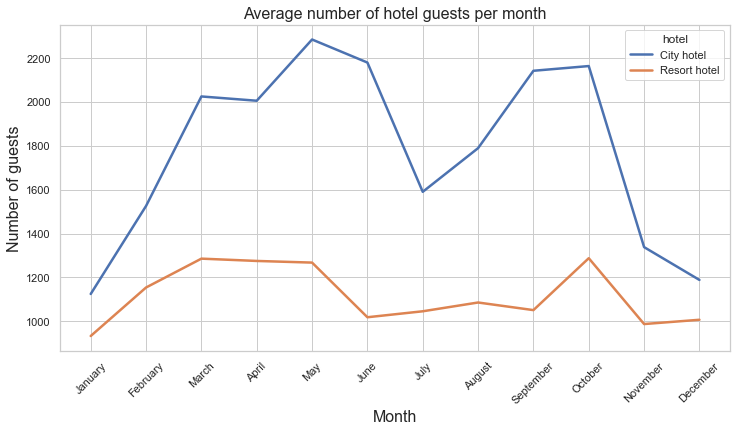

In [ ]:
# Create a DateFrame with the relevant data:
resort_guests_monthly = resort.groupby("arrival_date_month")["hotel"].count()
city_guests_monthly = city.groupby("arrival_date_month")["hotel"].count()

resort_guest_data = pd.DataFrame({"month": list(resort_guests_monthly.index),
                                  "hotel": "Resort hotel",
                                  "guests": list(resort_guests_monthly.values)})

city_guest_data = pd.DataFrame({"month": list(city_guests_monthly.index),
                                "hotel": "City hotel",
                                "guests": list(city_guests_monthly.values)})
full_guest_data = pd.concat([resort_guest_data,city_guest_data], ignore_index=True)

# order by month:
ordered_months = ["January", "February", "March", "April", "May", "June",
                  "July", "August", "September", "October", "November", "December"]
full_guest_data["month"] = pd.Categorical(full_guest_data["month"], categories=ordered_months, ordered=True)

# Dataset contains July and August date from 3 years, the other month from 2 years. Normalize data:
full_guest_data.loc[(full_guest_data["month"] == "July") | (full_guest_data["month"] == "August"),
                    "guests"] /= 3
full_guest_data.loc[~((full_guest_data["month"] == "July") | (full_guest_data["month"] == "August")),
                    "guests"] /= 2

#show figure:
plt.figure(figsize=(12, 6))
sns.lineplot(x = "month", y="guests", hue="hotel", data=full_guest_data,
             hue_order = ["City hotel", "Resort hotel"], size="hotel", sizes=(2.5, 2.5))
plt.title("Average number of hotel guests per month", fontsize=16)
plt.xlabel("Month", fontsize=16)
plt.xticks(rotation=45)
plt.ylabel("Number of guests", fontsize=16)
plt.show()

The City hotel has more guests during spring and autumn, when the prices are also highest.
In July and August there are less visitors, although prices are lower.

Guest numbers for the Resort hotel go down slighty from June to September, which is also when the prices are highest.
Both hotels have the fewest guests during the winter.

### How long do people stay at the hotels?

In [ ]:
# Create a DateFrame with the relevant data:
resort["total_nights"] = resort["stays_in_weekend_nights"] + resort["stays_in_week_nights"]
city["total_nights"] = city["stays_in_weekend_nights"] + city["stays_in_week_nights"]

num_nights_res = list(resort["total_nights"].value_counts().index)
num_bookings_res = list(resort["total_nights"].value_counts())
rel_bookings_res = resort["total_nights"].value_counts() / sum(num_bookings_res) * 100 # convert to percent

num_nights_cty = list(city["total_nights"].value_counts().index)
num_bookings_cty = list(city["total_nights"].value_counts())
rel_bookings_cty = city["total_nights"].value_counts() / sum(num_bookings_cty) * 100 # convert to percent

res_nights = pd.DataFrame({"hotel": "Resort hotel",
                           "num_nights": num_nights_res,
                           "rel_num_bookings": rel_bookings_res})

cty_nights = pd.DataFrame({"hotel": "City hotel",
                           "num_nights": num_nights_cty,
                           "rel_num_bookings": rel_bookings_cty})

nights_data = pd.concat([res_nights, cty_nights], ignore_index=True)

<ipython-input-33-fbf8cf2b1177>:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-33-fbf8cf2b1177>:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [ ]:
avg_nights_res = sum(list((res_nights["num_nights"] * (res_nights["rel_num_bookings"]/100)).values))
avg_nights_cty = sum(list((cty_nights["num_nights"] * (cty_nights["rel_num_bookings"]/100)).values))
print(f"On average, guests of the City hotel stay {avg_nights_cty:.2f} nights, and {cty_nights['num_nights'].max()} at maximum.")
print(f"On average, guests of the Resort hotel stay {avg_nights_res:.2f} nights, and {res_nights['num_nights'].max()} at maximum.")

On average, guests of the City hotel stay 2.92 nights, and 48 at maximum.
On average, guests of the Resort hotel stay 4.14 nights, and 69 at maximum.


For the city hotel there is a clear preference for 1-4 nights.
    For the resort hotel, 1-4 nights are also often booked, but 7 nights also stand out as being very popular.

### Bookings by market segment

In [ ]:
# total bookings per market segment (incl. canceled)
segments=full_data_cln["market_segment"].value_counts()

# pie plot
fig = px.pie(segments,
             values=segments.values,
             names=segments.index,
             title="Bookings per market segment"
            )
fig.update_traces(rotation=-90, textinfo="percent+label")
fig.show()

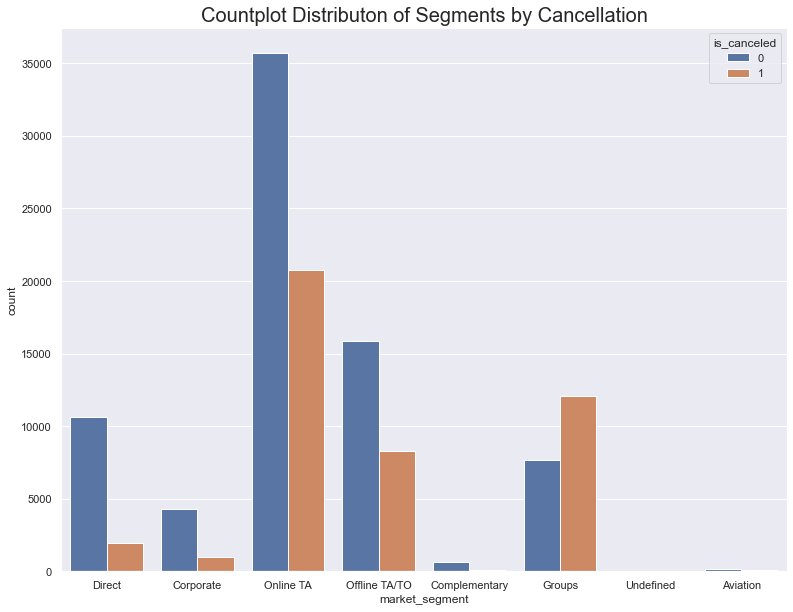

In [ ]:
plt.figure(figsize = (13,10))
sns.set(style = "darkgrid")
plt.title("Countplot Distributon of Segments by Cancellation", fontdict = {'fontsize':20})
ax = sns.countplot(x = "market_segment", hue = 'is_canceled', data = full_data_cln)

Looking at Offline TA/TO and Groups, the situations where the deposit was received were only in the scenarios where the groups came. It is quite logical to apply a deposit for a large number of customers who will fill important amount of the hotel capacity.

As a first thought, we expected the cancellation rate in the market segments where a deposit is applied to be lower than the other segments where no deposit applied. But when we look at the cancellations according to the segments in the other visualization, it seems that this is not the case.

Groups segment has cancellation rate more than 50%.
Offline TA/TO (Travel Agents/Tour Operators) and Online TA has cancellation rate more than 33%.
Direct segment has cancellation rate less than 20%.
It is surprising that the cancellation rate in these segments is high despite the application of a deposit. The fact that cancellations are made collectively like reservations may explain this situation a bit.

Cancellation rates for online reservations are as expected in a dynamic environment where the circulation is high.

Another situation that took my attention is that the cancellation rate in the direct segment is so low. At this point, I think that a mutual trust relationship has been established in case people are communicating one to one. I will not dwell on this much, but I think there is a psychological factor here.

### Price per night (ADR) and person based on booking and room.

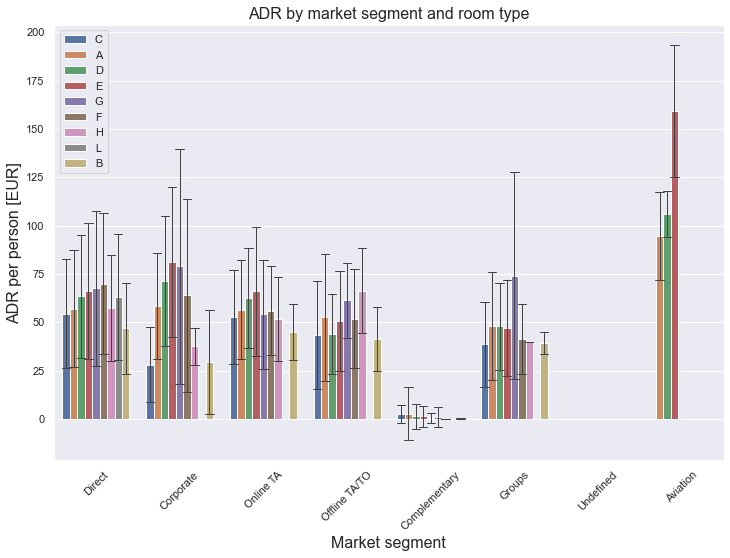

In [ ]:

# show figure:
plt.figure(figsize=(12, 8))
sns.barplot(x="market_segment",
            y="adr_pp",
            hue="reserved_room_type",
            data=full_data_cln,
            ci="sd",
            errwidth=1,
            capsize=0.1)
plt.title("ADR by market segment and room type", fontsize=16)
plt.xlabel("Market segment", fontsize=16)

plt.xticks(rotation=45)
plt.ylabel("ADR per person [EUR]", fontsize=16)
plt.legend(loc="upper left")
plt.show()

On average, groups get the best prices and Airlines pay approximately twice as much.

What are possible reasons for the high prices paid by Airlines?

In [ ]:
# Summarize Relevant data:
Airline_data = full_data_cln.loc[full_data_cln["market_segment"]== "Aviation"][["is_canceled",
                                                                                "adults",
                                                                                "lead_time",
                                                                                "adr_pp",]].describe()

Non_Airline_data = full_data_cln.loc[full_data_cln["market_segment"]!= "Aviation"][["is_canceled",
                                                                                    "adults",
                                                                                    "lead_time",
                                                                                    "adr_pp",]].describe()

In [ ]:
Airline_data

,is_canceled,adults,lead_time,adr_pp
count,235.000000,235.000000,235.00000,235.000000
mean,0.221277,1.012766,4.47234,100.270979
std,0.415992,0.112503,4.61629,20.376689
min,0.000000,1.000000,0.00000,0.000000
25%,0.000000,1.000000,1.00000,95.000000
50%,0.000000,1.000000,3.00000,95.000000
75%,0.000000,1.000000,6.00000,110.000000
max,1.000000,2.000000,23.00000,193.500000


In [ ]:
Non_Airline_data

,is_canceled,adults,lead_time,adr_pp
count,118975.000000,118975.000000,118975.000000,118971.000000
mean,0.371061,1.860878,104.306031,55.038212
std,0.483091,0.574499,106.888885,29.016998
min,0.000000,0.000000,0.000000,-3.190000
25%,0.000000,2.000000,18.000000,37.440000
50%,0.000000,2.000000,69.000000,49.500000
75%,1.000000,2.000000,161.000000,66.000000
max,1.000000,55.000000,737.000000,2700.000000


- Lead time for bookings from Aviation is very short: Mean 4 days compare with 104 days for other bookings.
- Airlines NEED a place for their crews to stay.
- Airline personel usually gets one room per person - more total rooms required compared to families.

### How long do people stay at the hotels?

Có thể thấy hầu hết các nhóm đều phân bố bình thường, một số nhóm có độ lệch cao. Nhìn vào phân bố, hầu hết mọi người dường như không thích ở khách sạn hơn 1 tuần. Nhưng có vẻ bình thường nếu ở trong các khách sạn nghỉ dưỡng lên đến 12-13 ngày
Rõ ràng là khi mọi người đến khách sạn nghỉ dưỡng, họ thích ở lại hơn.

In [ ]:
avg_nights_res = sum(list((res_nights["num_nights"] * (res_nights["rel_num_bookings"]/100)).values))
avg_nights_cty = sum(list((cty_nights["num_nights"] * (cty_nights["rel_num_bookings"]/100)).values))
print(f"On average, guests of the City hotel stay {avg_nights_cty:.2f} nights, and {cty_nights['num_nights'].max()} at maximum.")
print(f"On average, guests of the Resort hotel stay {avg_nights_res:.2f} nights, and {res_nights['num_nights'].max()} at maximum.")

On average, guests of the City hotel stay 2.92 nights, and 48 at maximum.
On average, guests of the Resort hotel stay 4.14 nights, and 69 at maximum.


<ipython-input-42-88803adb4b46>:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-42-88803adb4b46>:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



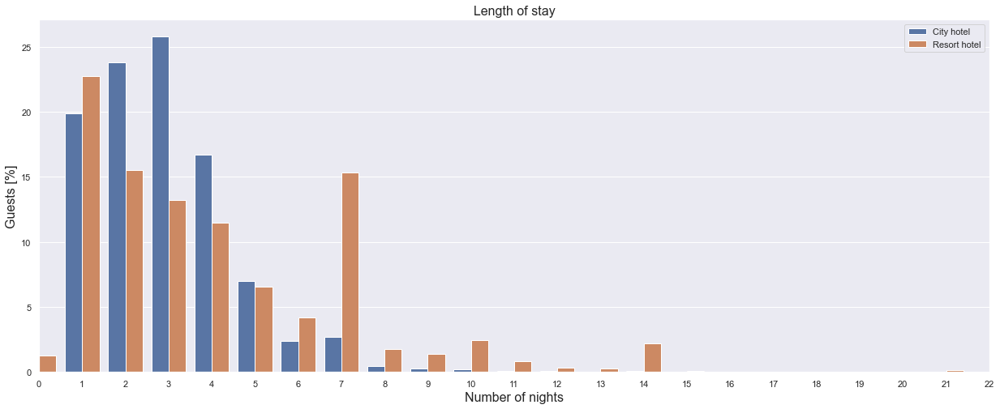

In [ ]:
# Create a DateFrame with the relevant data:
resort["total_nights"] = resort["stays_in_weekend_nights"] + resort["stays_in_week_nights"]
city["total_nights"] = city["stays_in_weekend_nights"] + city["stays_in_week_nights"]

num_nights_res = list(resort["total_nights"].value_counts().index)
num_bookings_res = list(resort["total_nights"].value_counts())
rel_bookings_res = resort["total_nights"].value_counts() / sum(num_bookings_res) * 100 # convert to percent

num_nights_cty = list(city["total_nights"].value_counts().index)
num_bookings_cty = list(city["total_nights"].value_counts())
rel_bookings_cty = city["total_nights"].value_counts() / sum(num_bookings_cty) * 100 # convert to percent

res_nights = pd.DataFrame({"hotel": "Resort hotel",
                           "num_nights": num_nights_res,
                           "rel_num_bookings": rel_bookings_res})

cty_nights = pd.DataFrame({"hotel": "City hotel",
                           "num_nights": num_nights_cty,
                           "rel_num_bookings": rel_bookings_cty})

nights_data = pd.concat([res_nights, cty_nights], ignore_index=True)


#show figure:
plt.figure(figsize=(21, 8))
sns.set(rc={"figure.dpi":70, 'savefig.dpi':300})
sns.barplot(x = "num_nights", y = "rel_num_bookings", hue="hotel", data=nights_data,
            hue_order = ["City hotel", "Resort hotel"])
plt.title("Length of stay", fontsize=16)
plt.xlabel("Number of nights", fontsize=16)
plt.ylabel("Guests [%]", fontsize=16)
plt.legend(loc="upper right")
plt.xlim(0,22)
plt.show()

For the city hotel there is a clear preference for 1-4 nights.  
For the resort hotel, 1-4 nights are also often booked, but 7 nights also stand out as being very popular. 

### Correlation between variables

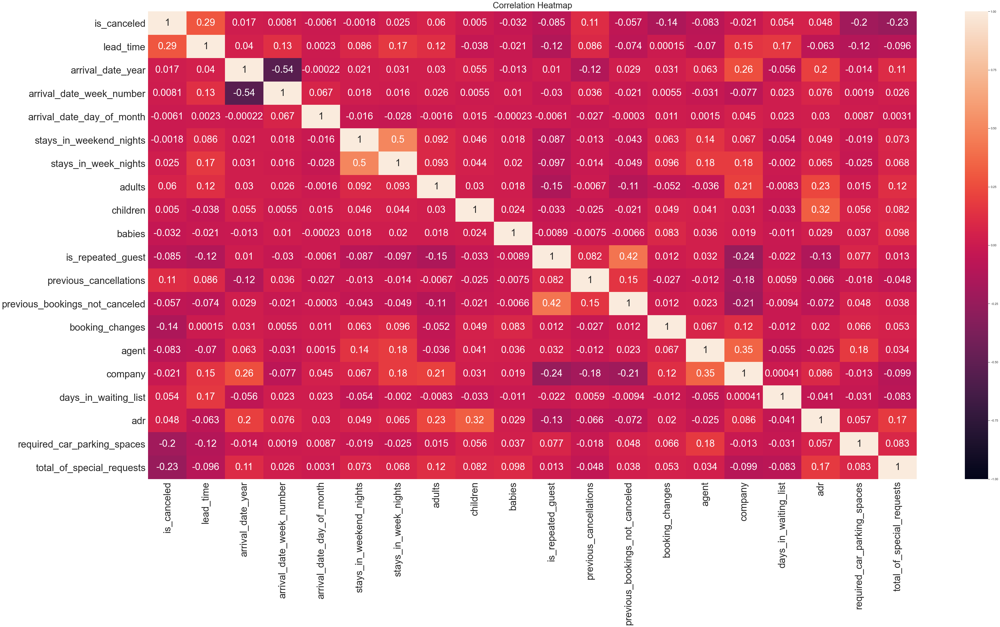

arrival_date_year               arrival_date_week_number         -0.540561
arrival_date_week_number        arrival_date_year                -0.540561
is_repeated_guest               company                          -0.244586
company                         is_repeated_guest                -0.244586
total_of_special_requests       is_canceled                      -0.234658
is_canceled                     total_of_special_requests        -0.234658
previous_bookings_not_canceled  company                          -0.208557
company                         previous_bookings_not_canceled   -0.208557
is_canceled                     required_car_parking_spaces      -0.195498
required_car_parking_spaces     is_canceled                      -0.195498
company                         previous_cancellations           -0.184574
previous_cancellations          company                          -0.184574
is_repeated_guest               adults                           -0.146426
adults                   

In [ ]:
# interactive heatmap:
corr  = full_data.corr(method='pearson')
fig = px.imshow(corr)
fig.show()

plt.figure(figsize=(64, 32))
heatmap = sns.heatmap(corr, vmin=-1, vmax=1, annot=True, annot_kws={"size":36})
sns.set(rc={"figure.dpi":70, 'savefig.dpi':300})
heatmap.set_title('Correlation Heatmap', fontdict={'fontsize':32}, pad=12)
heatmap.set_xticklabels(heatmap.get_xmajorticklabels(), fontsize = 36)
heatmap.set_yticklabels(heatmap.get_ymajorticklabels(), fontsize = 36)
locs, labels = plt.xticks()
plt.setp(labels, rotation=90)
plt.show()

sorted_matrix = corr.unstack().sort_values()
pd.set_option('display.max_rows', len(sorted_matrix))
print(sorted_matrix)
pd.reset_option('display.max_rows')

We can see that there are some interesting number in the correlation matrix
- Of course, arival date year and arrival date week number have a high correlation, self explained. No supprise here. The same with stay in week night and weekend night.
- In previous data, we talked about repeated guess tend to not cancel their booking, and in this matrix, we can see that repeated guess tend to not cancel their booking again, the correlation between repeated guess and cancel previous booking is high, at ~ 0.42.
- The number of guess that come with children is low, as seen in above chart, but we can see that the correlation between Average Daily Date(adr) and Children is also high, at 0.32, which indicates that customers who come with their children tend to pay more. This is reasonable since children often require more special services such as food and extra beds, which will make customers pay more, leads to higher adr.
- Also, adults and adr also have high correlation, more adults go on trip tend to pay more.
- Lead time and cancelled have a correlation of ~0.3 which indicates that the people who order very early tend to cancel their trip, supports our conclusion above that the longer the waiting time, the higher the probability of calcellation.
- Company and agent have a high correlation, so company tend to book trip for their empluyees via an agent.